# 프로젝트명 : CIFAR-10 이미지 생성하기

DCGAN 모델을 이용해 CIFAR-10 이미지 데이터를 생성한다.

## 루브릭

|순번|구분|세부내용|
|:---:|:---|:---|
|1|GAN의 두 모델 구조를 통해 이미지를 성공적으로 생성하였다.|오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.|
|2|생성 이미지 시각화 및 학습 그래프를 통해 GAN 학습이 바르게 진행되었음을 입증하였다.|gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.|
|3|추가적인 GAN 모델구조 혹은 학습과정 개선 아이디어를 제안하고 이를 적용하였다.|제출 아이디어를 제출 프로젝트에 반영하고, 그 결과가 아이디어 적용 이전보다 향상되었음을 시각적으로 입증하였다.|

## 필수 개념이해

### GAN

GAN은 Generative adversarial network 의 약자로, 우리말로 생산적 적대 신경망이라는 뜻을 갖습니다. 기존의 다른 딥러닝 모델과 달리 GAN은 각자 다른 역할을 하는 2개의 모델로 학습을 진행합니다. 

![img1](https://media.vlpt.us/images/wo7864/post/8202d354-5570-40d4-80fd-97cd55a6e2b6/image.png)

__Generator__는 위조 지폐, 즉 __Fake data__를 만드는 일을 합니다.

__Discriminator__는 Generator가 만든 위조 지폐를 확인 할 때도 있고, 진짜 지폐를 확인 할 때도 있습니다. 무엇이든 확인을 하고, "이것은 위조 지폐다." 또는 "진짜 지폐다." 처럼 __판별하는 역할__을 합니다.

이것이 GAN의 핵심인 두 모델이 하는 일입니다. 그러나 그냥 Generator는 위조 지폐를 만들고, Discriminator는 판별만해서는 발전 할 수 없겠죠. 그래서 두 모델은 매 순간 피드백하는 시간을 갖습니다.

이들이 피드백하며 발전하는 과정을 순서대로 나열해 보겠습니다.
아래부터는 편의 상 Generator를 G, 그리고 Discriminator를 D라고 지칭하겠습니다.

- D는 진짜 지폐를 보고 진짜 지폐가 어떻게 생겼는지 대충 배웠습니다.
- G는 아무것도 모르지만, 일단 아무거나 지폐라고 그리고 우겨봅니다.
- G가 만든 위조 지폐를 D가 확인하고는 가짜 또는 진짜의 판별을 합니다. 여기서, G에게 가짜라고 했다면 진짜가 되려면 어떻게 해야하는지 방향만 알려줍니다. 진짜라고 했다면, 진짜라고 잘하고있다고 말해줍니다.
- 동시에 D는 자신의 판별이 맞는지 확인합니다. 판별이 틀렸다면, 자신이 생각하는 지폐의 모양을 조금 수정합니다.
- G와 D는 각각 받은 피드백을 바탕으로 다시 위조지폐를 만들고, 판별하면서 피드백을 반복하며 그들의 능력을 키워나갑니다. 결국, G는 진짜 지폐와 매우 흡사한 위조 지폐를 만들 능력을 갖추게 되고, D는 매우 뛰어난 판별능력을 갖게 됩니다.  


위처럼 G는 D를 속이기 위해 성능이 오르고, D는 G가 만든 위조지폐를 잡기위해 성능이 오르는 상호 적대적인 관계를 보고 생성적 적대 신경망(GAN) 이라는 이름을 갖게되었습니다.

출처 : [GAN - 개념 이해](https://velog.io/@wo7864/GAN-%EA%B0%9C%EB%85%90-%EC%9D%B4%ED%95%B4)

### DCGAN

DCGAN(Deep Convolutional GAN,2015)는 CNN구조로 판별자 D와 생성자 G를 구성한 GAN입니다. 판별자 D는 이미지(예 28x28x3)를 입력으로 받아 binary classification을 수행하므로 CNN구조를, 생성자 G는 random vector z(예 (100,1))를 입력으로 받아 이미지(28x28x3)을 생성해야므로 deconvolutional network구조를 갖게됩니다.
또한 pooling layer를 사용하지 않고 stride 2이상인 convolution,deconvolution을 사용하였습니다.

![img2](https://media.vlpt.us/images/tobigs-gm1/post/c6e7c755-97c1-41d9-bcbb-df5b2667b422/image.png)

출처 : [GAN의 기초(GAN, DCGAN, WGAN, CGAN)](https://velog.io/@tobigs-gm1/basicofgan)

## 필요한 모듈/라이브러리 로드하기

In [1]:
# 라이브러리가 없을 경우 아래와 같이 입력 후 설치하기
# $ pip install imageio
# $ pip install Pillow

In [2]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

print("tensorflow", tf.__version__)

tensorflow 2.4.1


## 데이터셋 구성하기
tf.keras datasets에 포함되어 있는 CIFAR-10 데이터셋을 이용합니다.

In [3]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

print("Train Shape: ", train_x.shape)
print("Test Shape: ", test_x.shape)

Train Shape:  (50000, 32, 32, 3)
Test Shape:  (10000, 32, 32, 3)


### 이미지 정규화

학습에 사용할 train_x의 이미지를 -1, 1로 정규화합니다.


In [4]:
print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 255
min pixel: 0


In [5]:
train_x = (train_x - 127.5) / 127.5  # 이미지를 [-1, 1]로 정규화

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


### 학습 데이터 시각화

로드한 학습 데이터를 시각화를 통해 확인해 봅니다.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


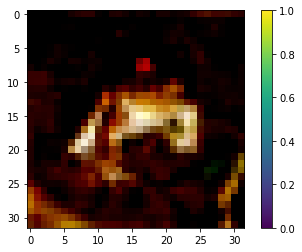

In [6]:
# 이미지 확인
plt.imshow(train_x[0])
plt.colorbar()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

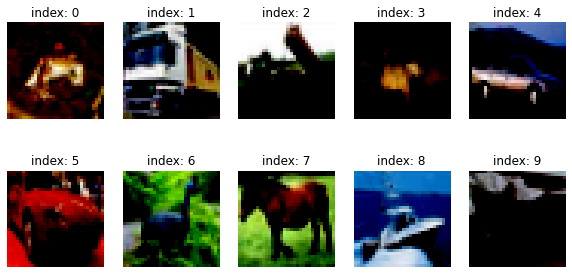

In [7]:
# 이미지 샘플 10개 불러오기
plt.figure(figsize=(10, 5))

for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(train_x[i])
    plt.title(f'index: {i}')
    plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

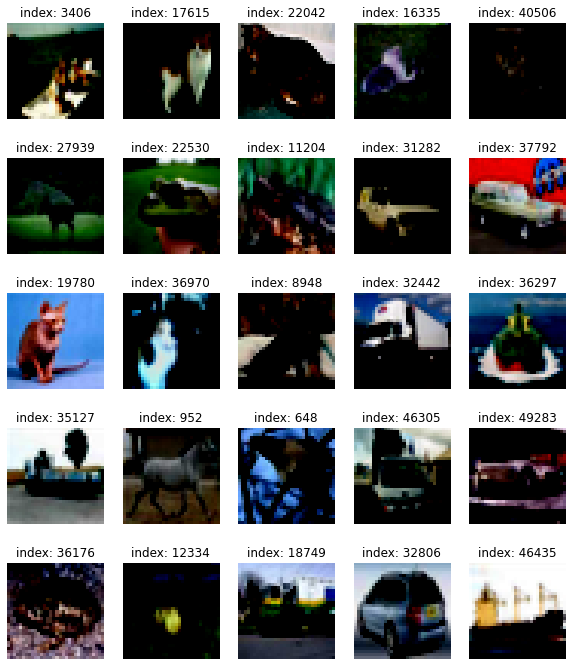

In [8]:
# 이미지 샘플 랜덤 추출
plt.figure(figsize=(10, 12))

for i in range(25):
    plt.subplot(5, 5, i+1)
    random_index = np.random.randint(1, 50000)
    plt.imshow(train_x[random_index].reshape(32, 32, 3))
    plt.title(f'index: {random_index}')
    plt.axis('off')
plt.show()

### 미니배치 데이터셋 구성

tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하여 미니배치 데이터셋을 구성합니다.

In [9]:
BUFFER_SIZE = 50000
BATCH_SIZE = 256

In [10]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## 생성자 모델 구현하기

In [12]:
# (32, 32, 3)의 shape를 가진 이미지를 생성하는 생성자 모델 구현 함수
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((8, 8, 256)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization(momentum=0.9))
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization(momentum=0.9))
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh')) # 1차원이 아닌 3차원 RGB

    return model

In [13]:
# 생성자 모델 summary 출력
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16384)             1638400   
_________________________________________________________________
batch_normalization (BatchNo (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 16384)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0

In [14]:
# 랜덤 벡터로 이루어진 노이즈 벡터 생성
noise = tf.random.normal([1, 100])

In [15]:
# 생성자 모델에 입력값으로 노이즈를 넣고 결과 이미지 생성
# 학습중이 아니기 때문에 training=False 설정
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

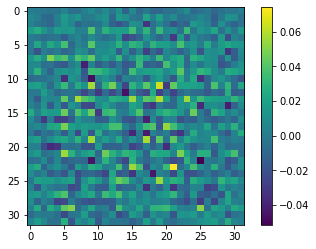

In [16]:
# 생성된 이미지 시각화
plt.imshow(generated_image[0, :, :, 0])
plt.colorbar()
plt.show()

## 판별자 모델 구현하기

In [17]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    # 이전 실습과 달리 이미지 크기와 RGB 차원이 변경되었음에 유의
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

In [18]:
# 판별자 모델 summary 출력
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

In [19]:
# 가짜 이미지를 판별자에 입력
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.001958]], dtype=float32)>

## 손실함수와 최적화 함수 구현하기

### 손실함수(Loss function)

GAN은 손실함수로 교차 엔트로피(Cross Entropy)를 사용합니다. 판별자는 이미지의 진위 여부를 판별해야 하므로 2개 클래스 간 분류 문제를 풀 때 활용하는 이진 교차 엔트로피(binary cross entropy)를 사용합니다.

In [20]:
'''
from_logits=True :
BinaryCrossEntropy에 입력된 값을 함수 내부에서 sigmoid 함수를 사용해  0~1 사이의 값으로 정규화한 후 알맞게 계산
'''
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True) 

진짜 이미지는 1, 가짜 이미지는 0이라고 하면  
생성자는 자신이 생성한 이미지를 판별자가 1(진짜 이미지)로 판별하도록 해야한다.  
따라서 생성자의 Loss는 생성한 이미지를 판별자가 판별한 결과를 입력으로 받아서,  
그 값이 얼마나 1에서 멀리 있는가를 기준으로 Loss를 결정한다.

In [21]:
# 생성자 loss 계산
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

판별자는 생성자가 생성한 이미지를 0(가짜)로 판별하거나 1(진짜)로 판별해야 한다.  
따라서 판별자의 Loss는 두 개의 Loss를 합쳐서 결정된다.
- 생성자가 생성한 이미지에 대한 판별 값이 얼마나 0에서 멀리있는가
- 실제 이미지에 대한 판별 값이 얼마나 1에서 멀리 있는가

In [22]:
# 판별자 loss 계산
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

판별자가 진짜 이미지와 가짜 이미지를 판별하는 accuracy가 최종적으로는 0.5에 가까워지는 것이 이상적이다.

In [23]:
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

### 최적화 함수(Optimizer)

생성자와 판별자가 개별적으로 학습을 진행하기 때문에 optimizer을 둘다 따로 만들어주어야 한다.

In [24]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)  # 학습 개선을 위해 `learning rate` 수치를 변경할 수 있다.
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

학습 진행 경과를 확인하기 위해 생성자가 생성한 샘플 확인하기

In [25]:
# 100차원의 노이즈를 총 16개, (16, 100) 형상의 벡터를 만듭니다.
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

## 훈련과정 상세 기능 구현하기

### @tf.function 데코레이터

In [26]:
# @tf.function 데코레이터가 사용된 함수에 입력된 입력은 Tensorflow의 graph 노드가 될 수 있는 타입으로 자동변환됩니다.
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

__train_step 이해하기__
- (1) 입력데이터: Real Image 역할을 할 images 한 세트를 입력으로 받음
- (2) 생성자 입력 노이즈 : generator가 FAKE IMAGE를 생성하기 위한 noise를 images 한 세트와 같은 크기인 BATCH_SIZE 만큼 생성함
- (3) tf.GradientTape()는 가중치 갱신을 위한 Gradient를 자동 미분으로 계산하기 위해 with 구문 열기
- (4) generated_images 생성 : generator가 noise를 입력받은 후 generated_images 생성
- (5) discriminator 판별 : discriminator가 Real Image인 images와 Fake Image인 generated_images를 각각 입력받은 후 real_output, fake_output 출력
- (6) loss 계산 : fake_output, real_output으로 generator와 discriminator 각각의 loss 계산
- (7) accuracy 계산 : fake_output, real_output으로 discriminator의 정확도 계산
- (8) gradient 계산 : gen_tape와 disc_tape를 활용해 gradient를 자동으로 계산
- (9) 모델 학습 : 계산된 gradient를 optimizer에 입력해 가중치 갱신
- (10) return값 : 이번 스텝에 계산된 loss와 accuracy를 리턴  

In [27]:
# 샘플 이미지 생성 및 저장, 시각화
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        image = predictions.numpy()
        image = (image * 127.5) + 127.5 # [0, 255]로 스케일링
        image = image.astype(int)
        plt.subplot(4, 4, i+1)
        plt.imshow(image[i])
        plt.axis('off')
   
    plt.savefig('{}/aiffel/exploration/E13/data/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()

- 참고자료 : [[양재] 와글와글 유상민님 게시글](https://aiffel.agit.io/g/300307139/wall)

In [28]:
# 학습과정 loss, accuracy 그래프 시각화
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('{}/aiffel/exploration/E13/data/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

In [29]:
# 정기적으로 모델 저장을 위한 checkpoint 생성
checkpoint_dir = os.getenv('HOME')+'/aiffel/exploration/E13/data/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## 학습 과정 진행하기

In [30]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

In [31]:
save_every = 20
EPOCHS = 500

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

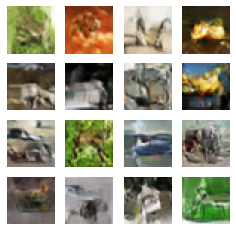

Time for training : 14945 sec


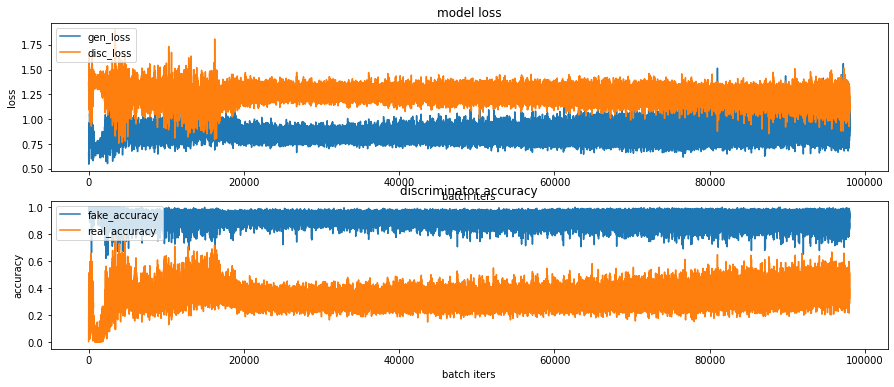

CPU times: user 4h 8min 57s, sys: 4min 15s, total: 4h 13min 12s
Wall time: 4h 9min 9s


In [32]:
%%time
train(train_dataset, EPOCHS, save_every)

# 학습과정의 loss, accuracy 그래프 이미지 파일이 ~/aiffel/exploration/E13/data/cifar10/training_history 경로에 생성되고 있으니
# 진행 과정을 수시로 확인할 수 있다.

### 학습과정 시각화

In [34]:
anim_file = os.getenv('HOME')+'/aiffel/exploration/E13/data/cifar10/cifar10_dcgan2.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/exploration/E13/data/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/exploration/E13/data/cifar10/cifar10_dcgan2.gif

-rw-r--r-- 1 root root 4402064 Sep  2 09:15 /aiffel/aiffel/exploration/E13/data/cifar10/cifar10_dcgan2.gif


### 완성된 모델 로드

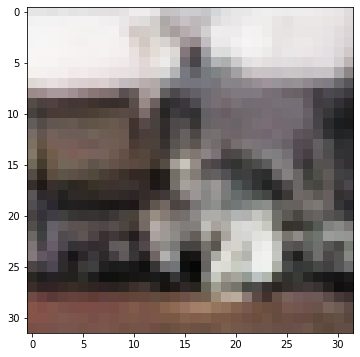

In [54]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/exploration/E13/data/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

## GAN 훈련 과정 개선하기

### __1차 시도__ (Baseline Model 기반)  
>  
> 1) 모델구성  
> - 실습 노드를 기반으로 모델을 구성하여 Actvaition function, BN, learning rate 등을 따로 조정해지 주지 않았다.  
>  
> 2) 학습
> - EPOCHS = 500  
>  
> 3) 최종 결과   
> - 실습 노드 코드를 기반으로 학습을 실시 하였으나 EPCOHS가 400이 넘어도 뚜렷한 형체가 안보여서 학습을 종료시켰다.

In [55]:
from IPython.display import Image
image_file = os.getenv('HOME')+'/aiffel/exploration/E13/data/cifar10/cifar10_dcgan.gif'

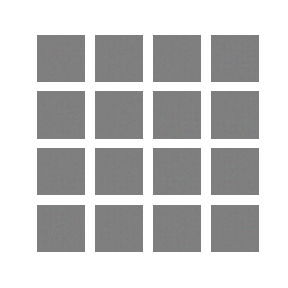

In [56]:
# 1차 시도
Image(open(image_file,'rb').read())

### 2차 시도
- 퍼실님의 조언을 받아 아래와 같이 모델 구성을 변경하여 다시 학습을 시도해보았다. 

> 1) 모델구성  
> - alpha=0.2 (leaky ReLU)
> - mementum=0.9 (BatchNormalization)
> - beta_1=0.5 (AdamOptimizer) 
>  
> 2) 학습
> - EPOCHS = 500  
>  
> 3) 최종 결과   
> - gif 파일을 살펴보니 뭔가 생기다 만 느낌이 들면서도 말, 자동차 등이 보이는 것 같다. 특히 말 같은 경우엔 몸통은 제대로 형성 되고 있는데 머리가 부분이 잘 그려지지 않은 것 같다.

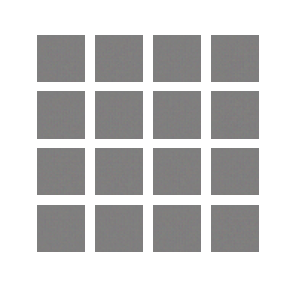

In [41]:
# 2차 시도
from IPython.display import Image
Image(open(anim_file,'rb').read())

# 회고

### 주요 학습내용

- 생성 모델링(Generative Modeling)과 다양한 활용 기법들(Pix2Pix, CycleGan, Neural Style Transfer)


- GAN(Generative Adversarial Network), 생성자(Generator), 판별자(Discriminator) 개념


- DCGAN(Deep Convolutional GAN) 개념

### 정리

- SBS에서 특집으로 __[세기의 대결 AI vs 인간]__이라는 주제를 가지고 방송을 한 프로그램이 있었는데 당시 주제로 __주식, 모창AI, 트로트 작곡 등__ 다양한 분야에서 개발된 인공지능이 사람과 대결을 하는 것이었다.  
  
  
- 당시에 방송을 보면서 진화된 인공지능 기술에 대해 놀라움을 금치 못했었는데, 방송에서 봤던 내용과 유사한 컨셉의 인공지능 학습을 내가 실제로 구현해볼 수 있어 매우 인상 깊었던 노드였다.  


- 하지만 그럼에도 불구하고 월요일 cs231n 발표, 화요일 EX 12번 노드 제출, 데이콘 풀잎 과제 제출, 수요일 캐글 놀이터 스터디 발표 및 백신접종 일정까지 겹쳐 노드를 할 수 있는 일정이 너무 빠듯 하였습니다. 그리고 백신접종 후 컨디션이 안좋은 관계로 노드에 많은 시간을 할애하지 못한 점이 아쉽습니다.   
  

- Fake accuracy를 높이기 위해서 모델 구성단계에서 다양한 하이퍼파라미터 조정을 해봐야할 것 같습니다.  
  

- 나중에 기회가 되면 유명 연예인 사진을 모아서 닮은 꼴을 만들어보는 프로젝트를 해봐도 재미 있을 것 같고 여행지 사진을 활용해서 'Neural Style Transfer' 기법의 사진도 만들어보고 싶습니다.